## VAE

This is an implemention of a Variational autoencoder inspired by the implementation found here: https://keras.io/examples/generative/vae/ 

The idea behind a variational autoencoder is covered in a different notebook. Especially, the derivation of the loss function and formulas used here.

The goal is to apply a variational autoencoder on a dataset different than the standard datasets (e.g. MNIST). So the code is kept simple and therefore will include some hardcoded parts.

I use the Swiss coin dataset found here:
https://www.kaggle.com/ai-first/swisscoins

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

### Reparametrisation trick

The output of the encoder is a distribution or in our case the mean (z_mean) and (log)variance (z_log_var) of the Gaussian distribution. We then use z_mean, z_log_var to sample z as input for the decoder. Here we have to express the sampling process in way that backpropagation is possible. Since z is Gaussian we can express it as follows (Reparametrisation trick):

<math>
    \begin{align}
    \epsilon &\sim \mathcal{N}(0,1) \\
        z&= \epsilon \sigma_x + \mu_x 
    \end{align}
<math>

### Sampling Layer

In [9]:
class Sampling(layers.Layer):
    
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

### VAE
Here we will use two different loss function: One is the normal loss function of a VAE and one without the KL-term. In some expositions of VAE you will also encounter this loss function:
<math>
\begin{align}
Loss = \parallel x-\hat{x}\parallel _2 + \lambda * D_{KL}(q(z \mid x) \parallel p(z) ) 
\end{align}
</math>

Here $\lambda$ is a hyperparameter for scaling the KL-loss. When setting a high $\lambda$ the reconstruction loss will suffer and by setting a lambda close to 0 the latent space may be no as organized as you want it to be. A $\lambda$ of 0 would corresponds to a simple autoencoder (with a sampling layer). 

In [10]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
            #total_loss = reconstruction_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
        


# Coin

### Encoder + Decoder
To keep it simple the encoder and decoder contains many hard-coded code. We use a bottleneck of dimension 128 and rescaled the picture to 128x128x3

In [21]:
latent_dim=128
input_shape=(128,128,3)

In [22]:
def get_encoder():
    encoder_inputs = keras.Input(shape=input_shape)
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)

    x = layers.Flatten()(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z = Sampling()([z_mean, z_log_var])
    return keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")


In [23]:
def get_decoder():
    latent_inputs = keras.Input(shape=(latent_dim,))
    # output_shape=get_encoder().get_layer("conv3").output.shape
    
    x = layers.Dense(16 * 16 * 128, activation="relu")(latent_inputs)
    x = layers.Reshape((16, 16, 128))(x)
   
    x = layers.Conv2DTranspose(256, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

## Loading training and test sets
We use the Swiss Coin dataset. This dataset is quite challenging since we don't have many different colors. Also the amount of training data available is small (400 images). We therefore use data augmentation techniques to create 16'000 aditional images. Note that it is usually more practical to use a generator for data augmentation on the fly.

In [24]:
train_ds= tf.keras.preprocessing.image_dataset_from_directory(
    'data/train_new',
    label_mode=None,
    validation_split=0.1,
    subset="training",
    seed=123,
    image_size=(128, 128),
    batch_size=32)

val_ds= tf.keras.preprocessing.image_dataset_from_directory(
    'data/train_new',
    label_mode=None,
    validation_split=0.1,
    subset="validation",
    seed=123,
    image_size=(128, 128),
    batch_size=32)

test_ds= tf.keras.preprocessing.image_dataset_from_directory(
    'data/test',
    label_mode=None,
    image_size=(128, 128),
    batch_size=32)

Found 16344 files belonging to 1 classes.
Using 14710 files for training.
Found 16344 files belonging to 1 classes.
Using 1634 files for validation.
Found 44 files belonging to 1 classes.


In [26]:
# Normalization and Prefetching
normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x: (normalization_layer(x)))
normalized_test_ds= test_ds.map(lambda x: (normalization_layer(x)))
normalized_val = val_ds.map(lambda x: (normalization_layer(x)))
trainer = normalized_ds.cache().prefetch(buffer_size=-1)

### Model

In [28]:
encoder=get_encoder()
decoder=get_decoder()
vae=VAE(encoder,decoder)
vae.load_weights('./weights_test2/vae') #weights_test1/vae
#vae1=VAE(encoder,decoder)
#vae1.load_weights('./weightst_kl_full/vae')

### Training

In [ ]:
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(trainer, epochs=20, batch_size=128, validation_data=normalized_val)

### Prediction
Additionally, we will also add (a lot) noise to the encoded vector and see how this will influence the reconstruction

In [29]:
noise=np.random.normal(0, 1, size=(1, 128))
sampler=Sampling()

original=[]
vae_data=[]
noise_data=[]
for images in test_ds.take(1):
    for i in range(10):

        original.append(images[i].numpy()/255.)
        z_mean,z_log_var,z=vae.encoder.predict(np.expand_dims(images[i].numpy()/255.,axis=0))
        reconstruction=vae.decoder(z)[0]
        vae_data.append(reconstruction)
        noise_data.append(vae.decoder(z_mean+noise)[0])

<Figure size 720x720 with 0 Axes>

## Plotting

In [14]:

def show_subplot(original, reconstructed,cc):
    plt.figure(figsize=(15, 15))
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed)
    plt.title("VAE")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(cc)
    plt.title("VAE with noise")
    plt.axis("off")

    plt.show()

### Test set: $\lambda$ = 1

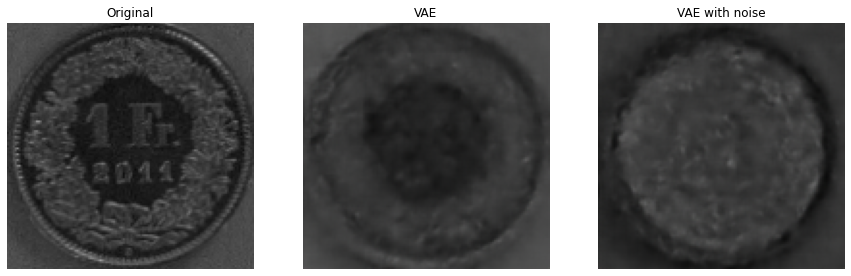

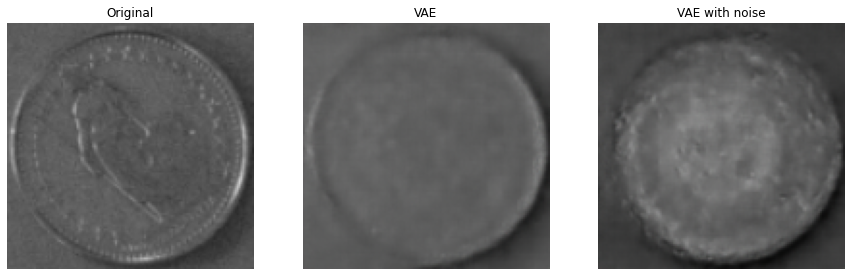

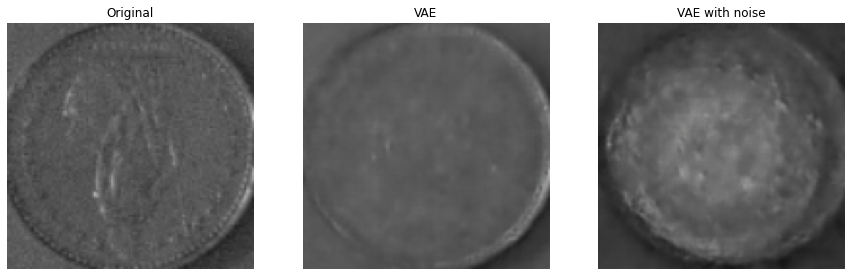

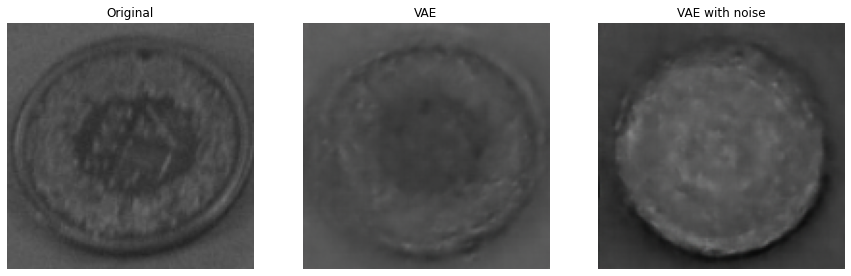

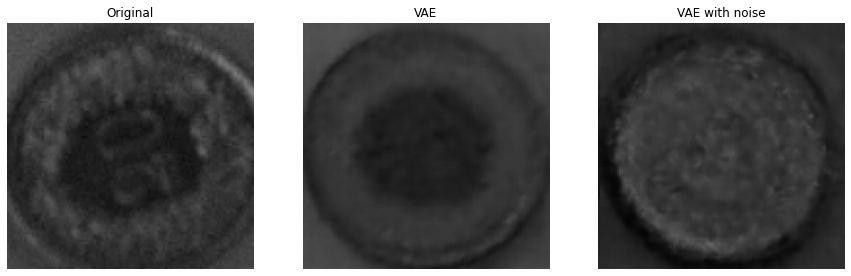

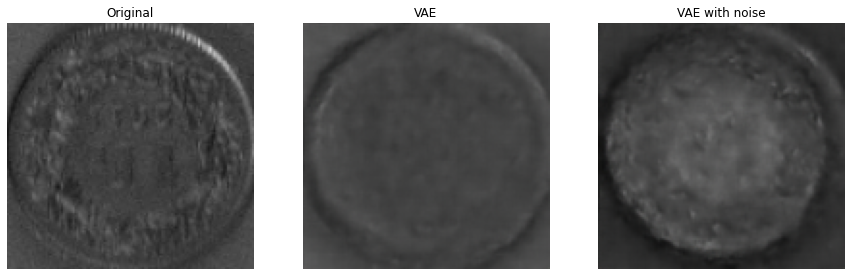

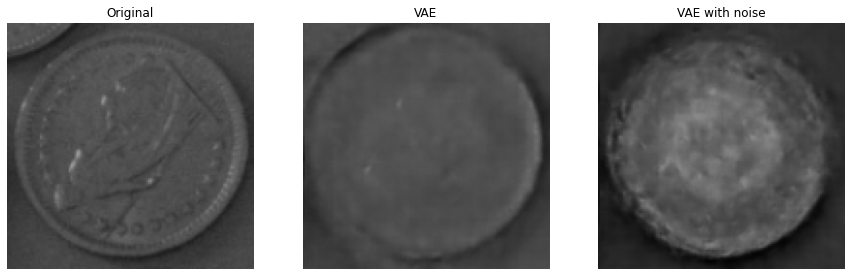

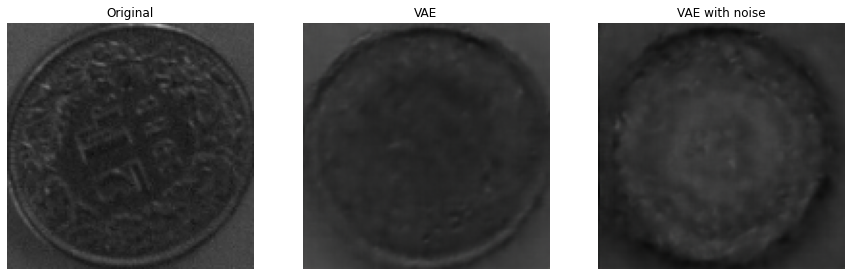

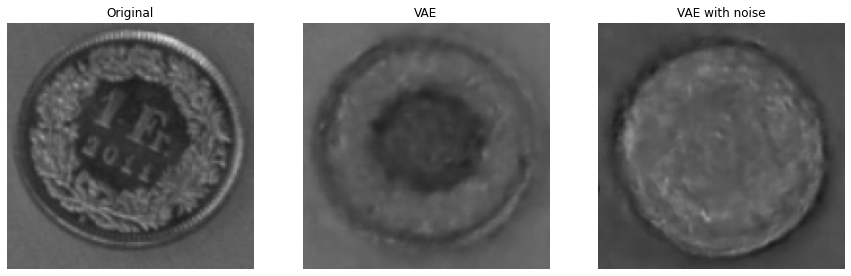

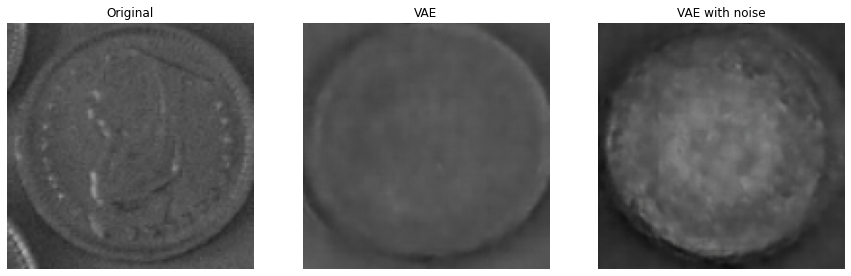

In [16]:
# Test data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

### Training set: $\lambda$ = 1

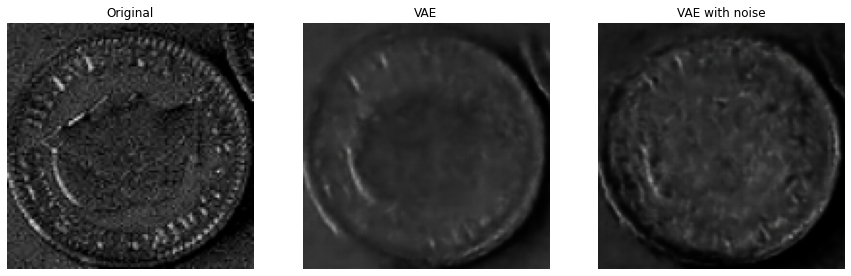

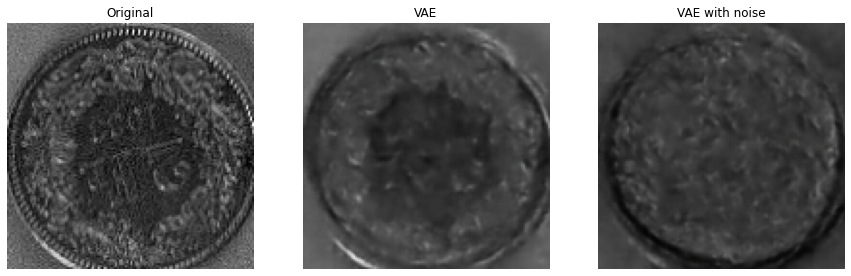

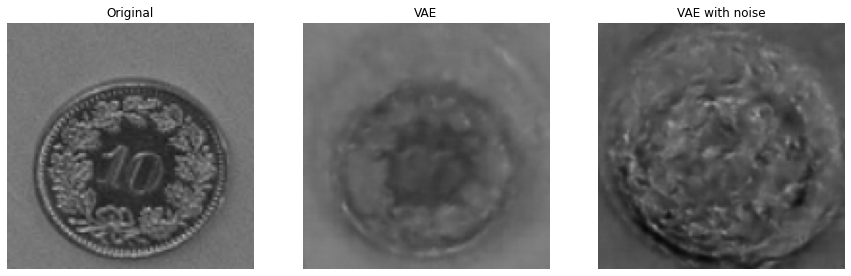

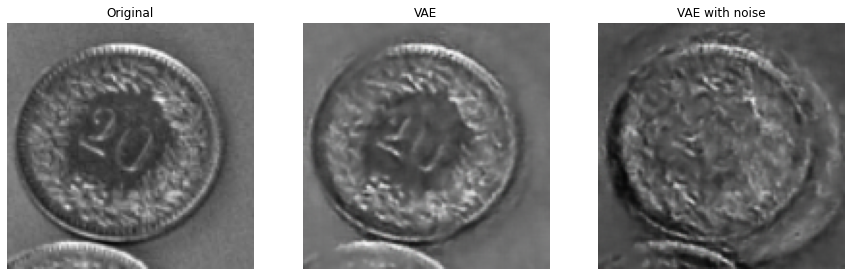

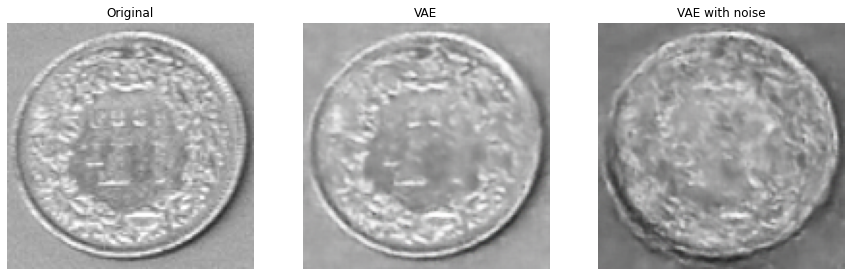

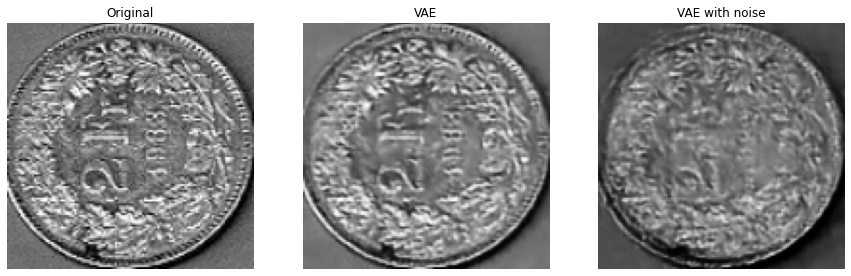

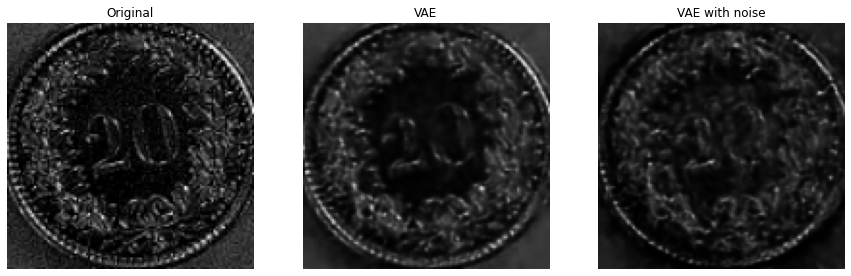

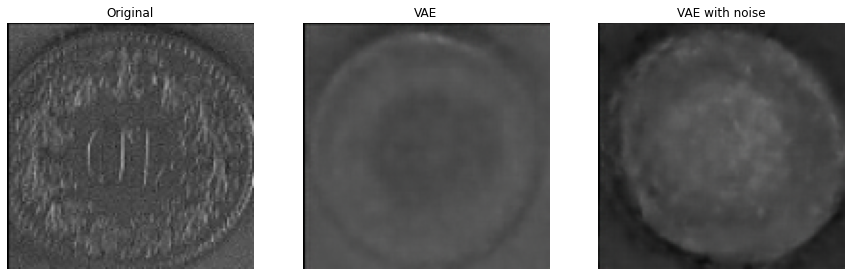

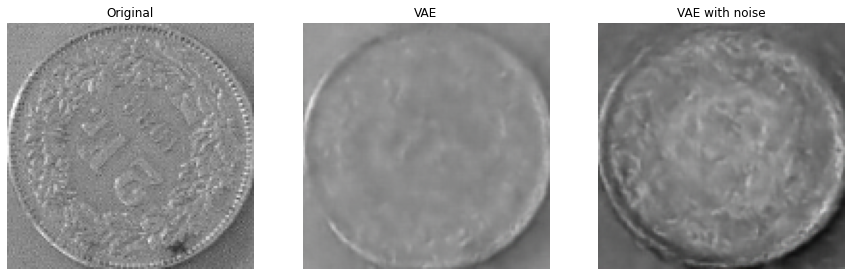

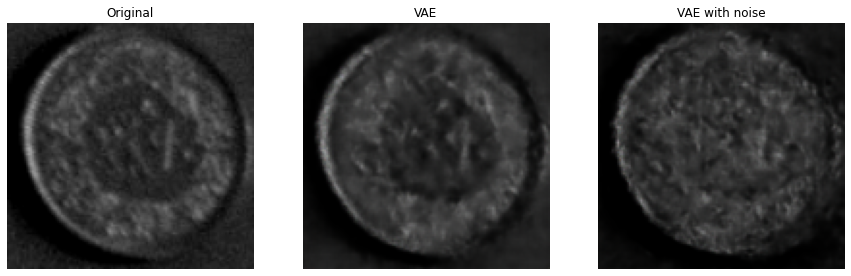

In [12]:
# Train dataset
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

When comparing the result on the train and test dataset we experience a huge gap. The reconstruction on the train dataset are "successful" in some cases but completely failed on the test dataset. It seems the KL-term doesn't have the regularisation effect we expect. Also the added noise vector is affecting the reconstruction more in cases where the reconstruction was not "successful". 

### Training set: $\lambda$ = 0

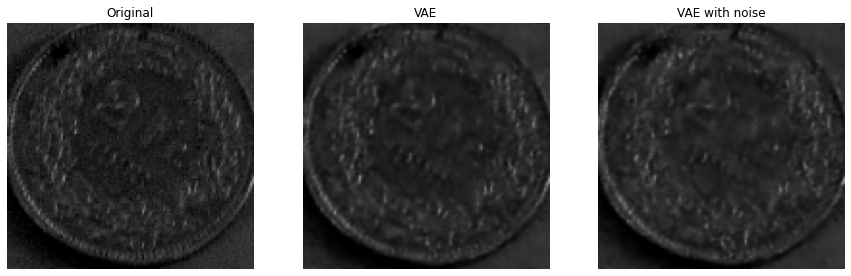

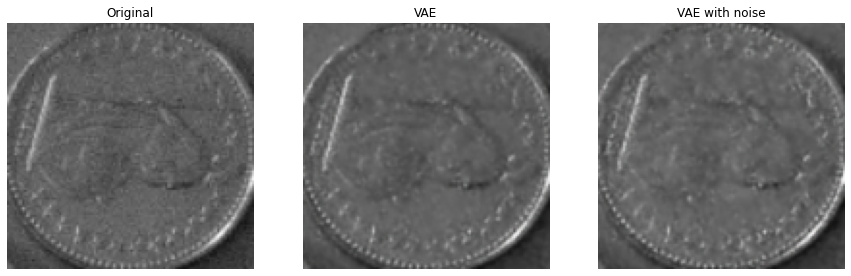

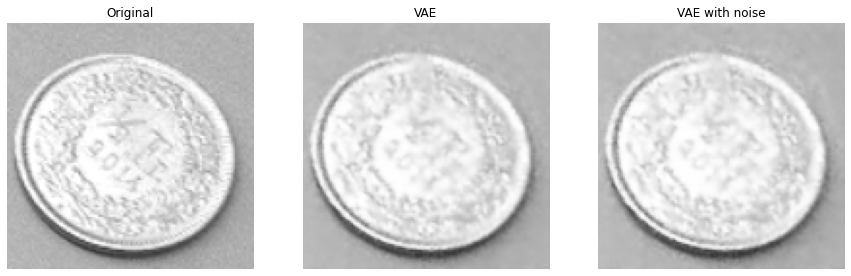

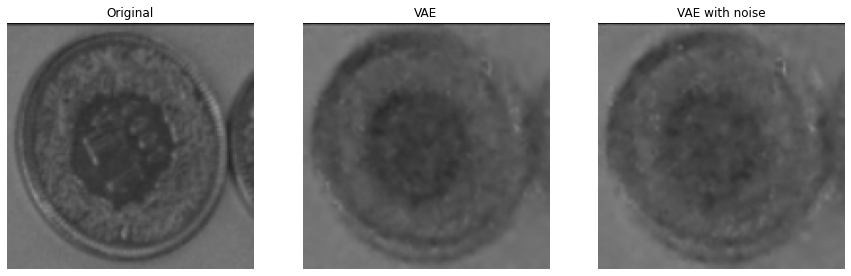

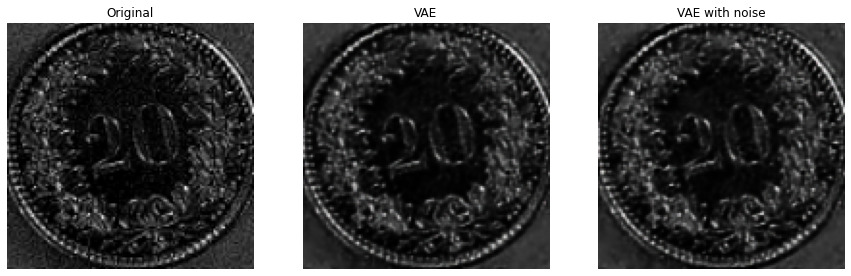

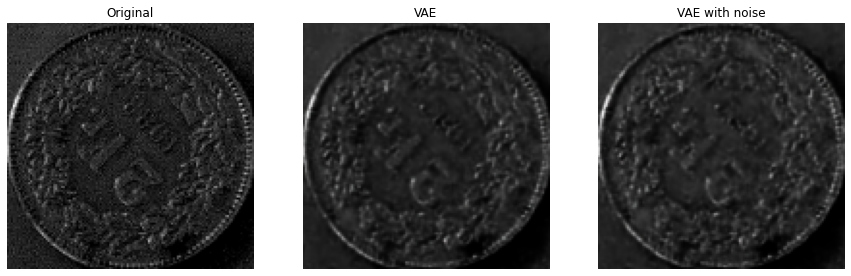

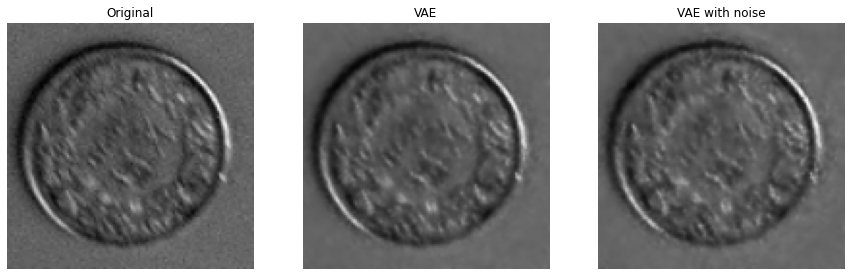

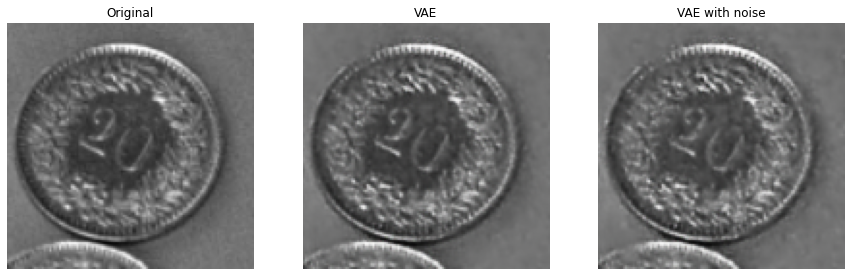

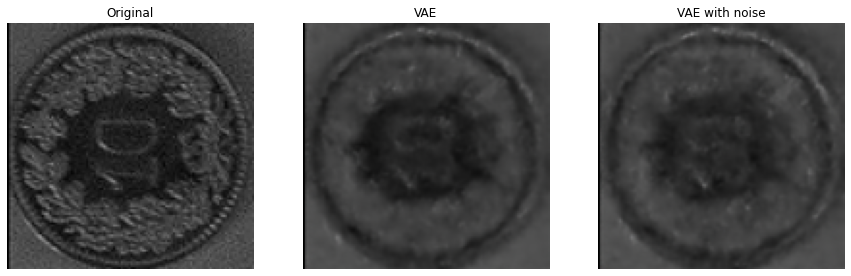

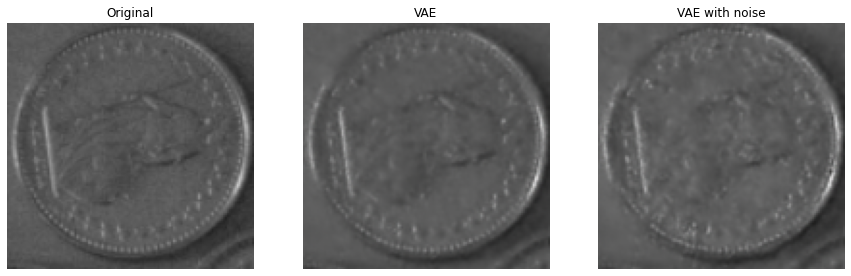

In [15]:
# Train data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

### Test set: $\lambda$ = 0

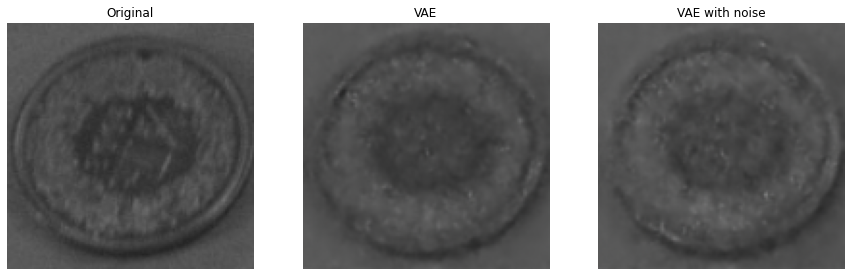

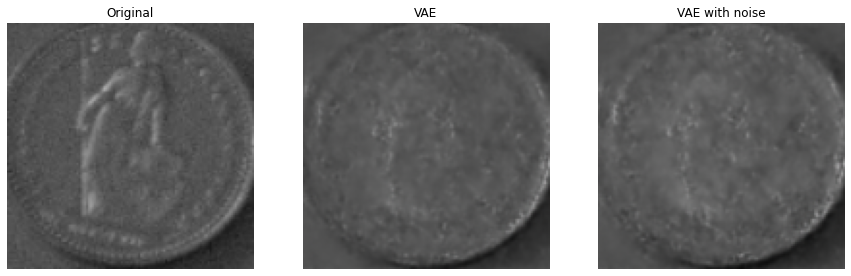

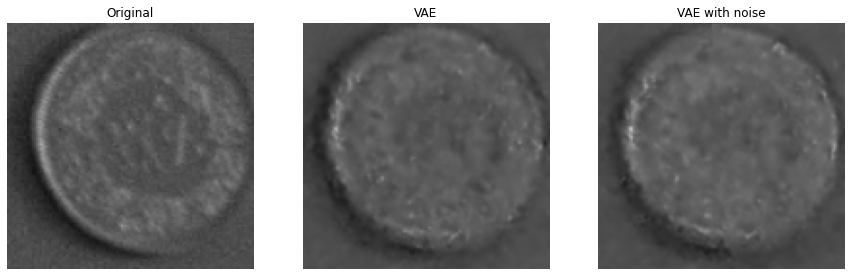

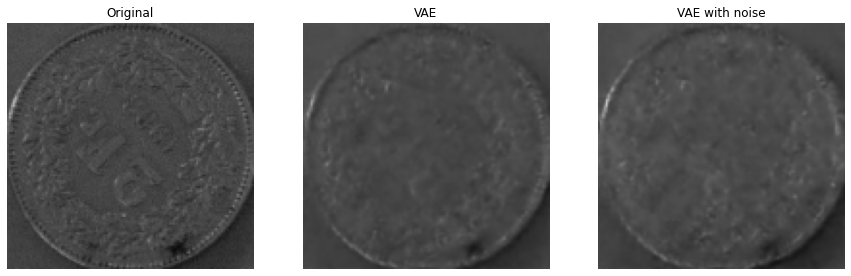

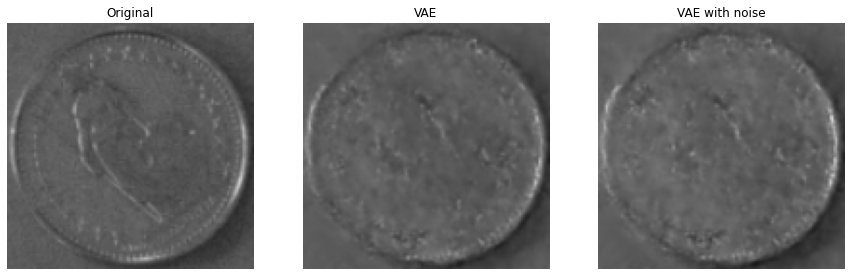

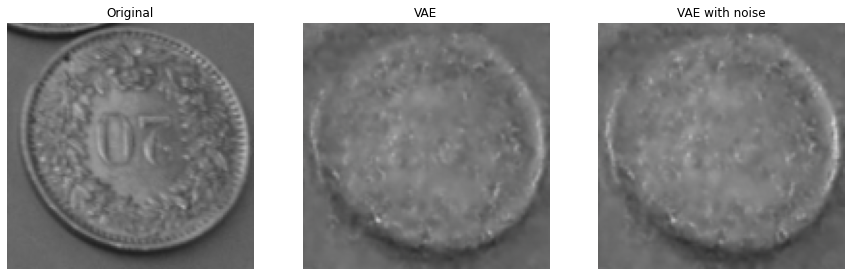

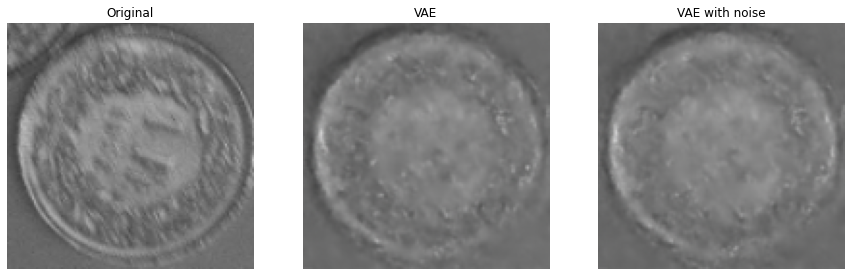

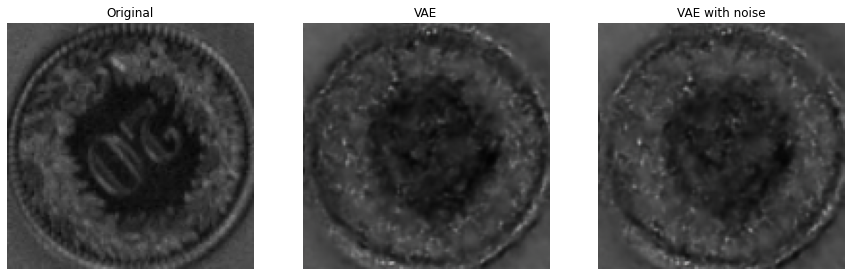

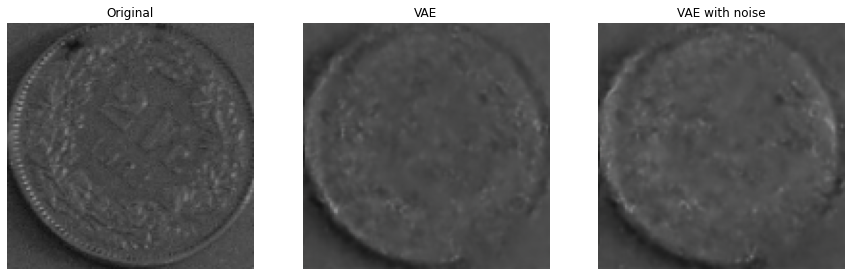

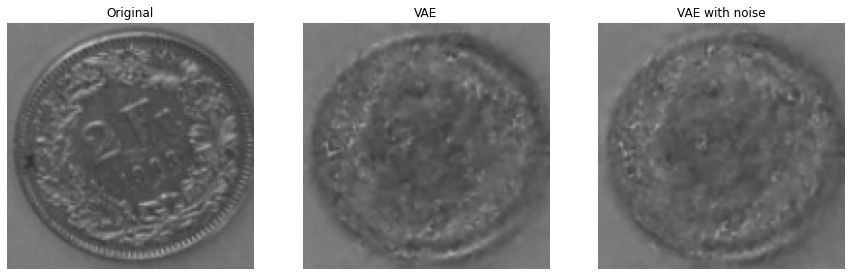

In [17]:
# Test data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

The flowers may be difficult to reproduce and the neural network may try to reconstruct which may also harm the performance on the easier features (e.g. numbers)

# Milb
Let's see the results on a different data set. This dataset contains around 10'000 pictures of size (80,60,3) and we don't apply any augmentation techniques.

In [2]:
latent_dim=128
input_shape=(80,60,3)

In [3]:
def get_encoder():
    encoder_inputs = keras.Input(shape=input_shape)
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Flatten()(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z = Sampling()([z_mean, z_log_var])
    return keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

In [4]:
def get_decoder():
    latent_inputs = keras.Input(shape=(latent_dim,))
    # output_shape=get_encoder().get_layer("conv3").output.shape
    
    x = layers.Dense(20 * 15 * 128, activation="relu")(latent_inputs)
    x = layers.Reshape((20, 15, 128))(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

In [5]:
train_ds= tf.keras.preprocessing.image_dataset_from_directory(
    'output/train',
    label_mode=None,
    validation_split=0.1,
    subset="training",
    seed=123,
    image_size=(80, 60),
    batch_size=32)

val_ds= tf.keras.preprocessing.image_dataset_from_directory(
    'output/val',
    label_mode=None,
    validation_split=0.1,
    subset="validation",
    seed=123,
    image_size=(80, 60),
    batch_size=32)

Found 10096 files belonging to 1 classes.
Using 9087 files for training.
Found 1122 files belonging to 1 classes.
Using 112 files for validation.


In [7]:
# Normalization and Prefetching
normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x: (normalization_layer(x)))
normalized_val = val_ds.map(lambda x: (normalization_layer(x)))
trainer = normalized_ds.cache().prefetch(buffer_size=-1)

In [25]:
encoder=get_encoder()
decoder=get_decoder()
vae=VAE(encoder,decoder)
vae.load_weights('./milb_test_kl/vae')#milb_test_kl,milb_test
#vae1=VAE(encoder,decoder)
#vae1.load_weights('./weightst_kl_full/vae')

In [28]:
noise=np.random.normal(0, 1, size=(1, 128))
sampler=Sampling()
plt.figure(figsize=(10, 10))
original=[]
vae_data=[]
noise_data=[]
for images in val_ds.take(1):
  for i in range(10):

    original.append(images[i].numpy()/255.)
    z_mean,z_log_var,z=vae.encoder.predict(np.expand_dims(images[i].numpy()/255.,axis=0))
    reconstruction=vae.decoder(z)[0]
    vae_data.append(reconstruction)
    noise_data.append(vae.decoder(z_mean+noise)[0])

<Figure size 720x720 with 0 Axes>

### Training/Test, $\lambda$ = 0

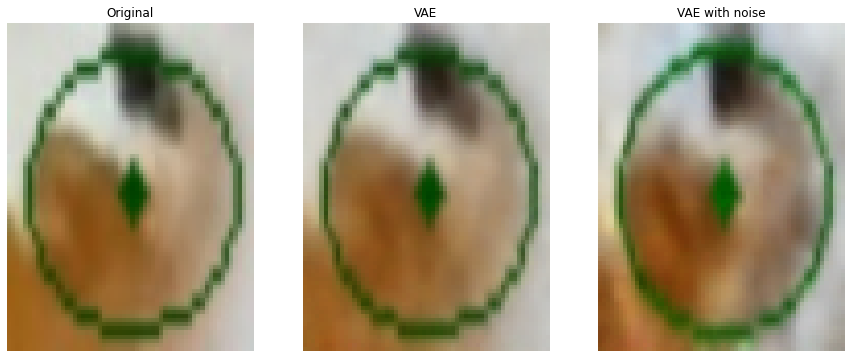

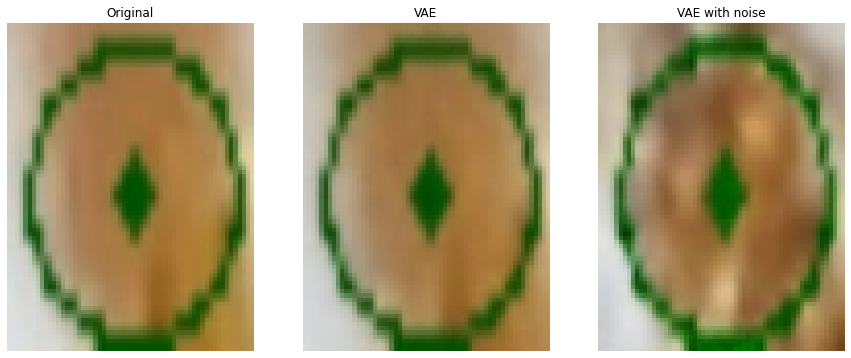

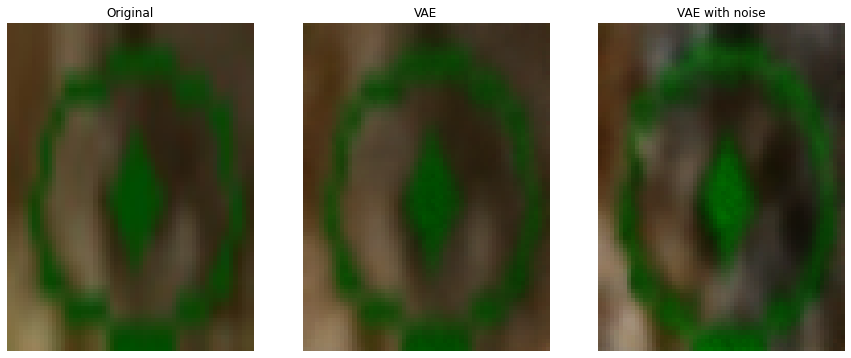

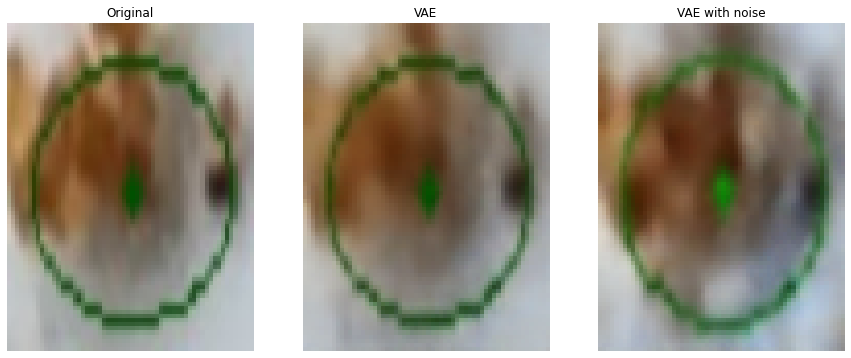

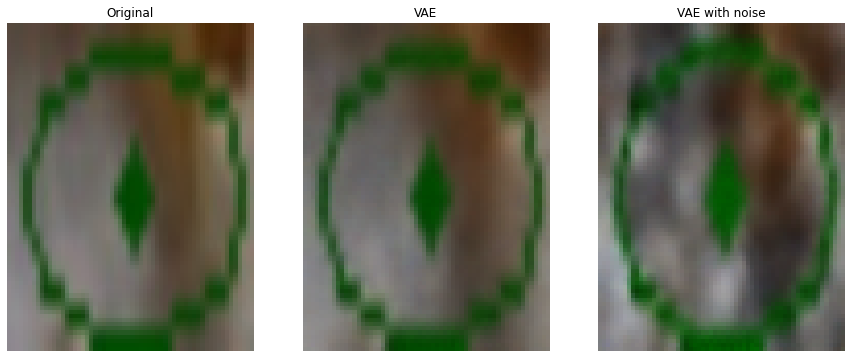

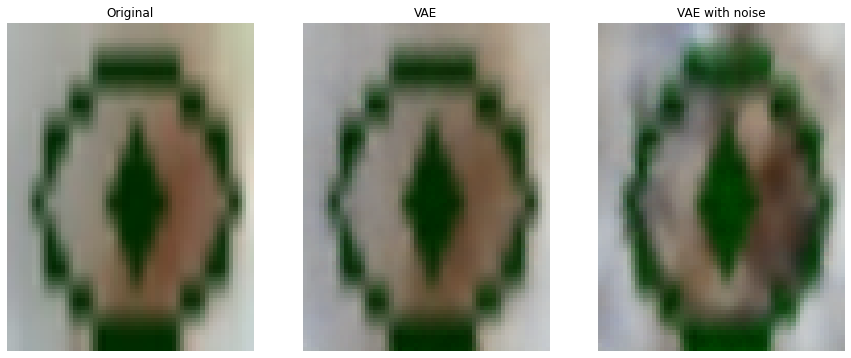

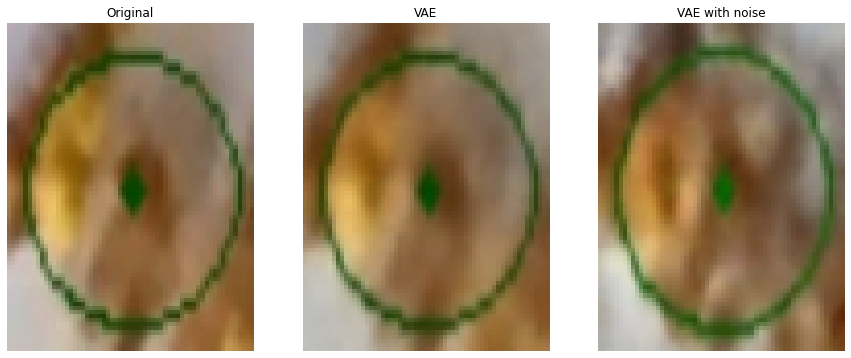

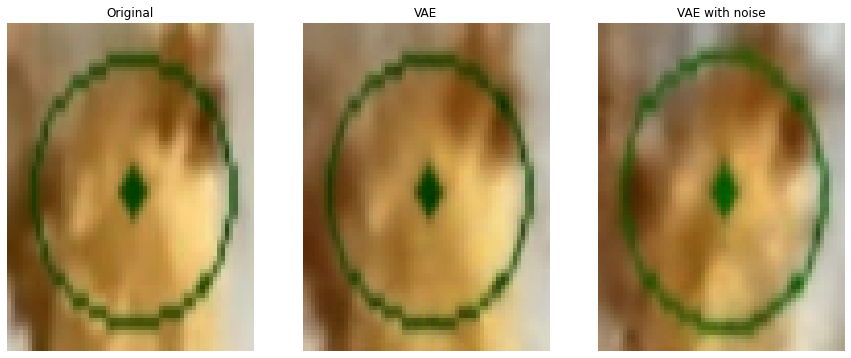

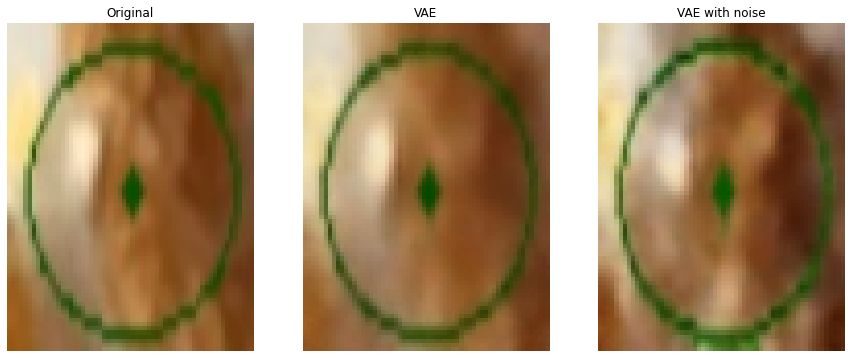

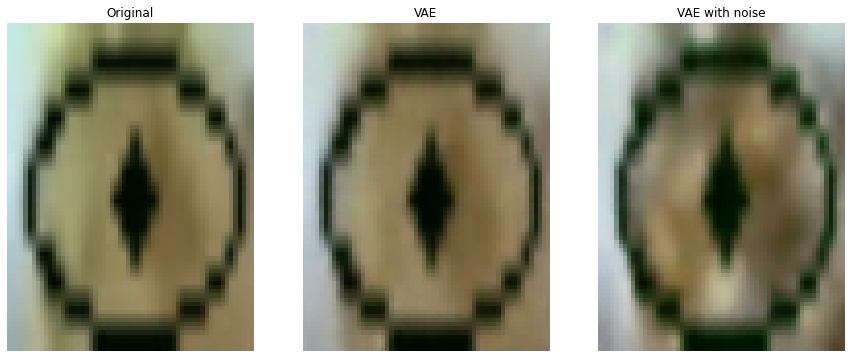

In [17]:
# Train data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

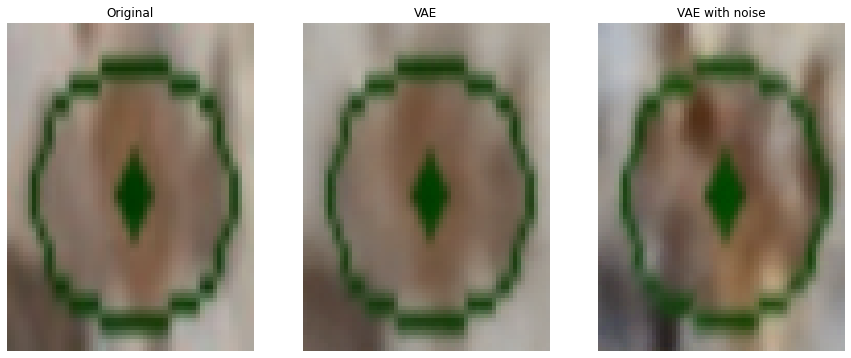

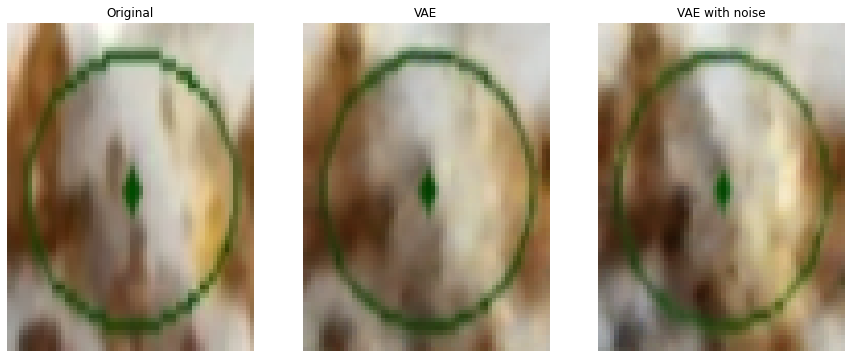

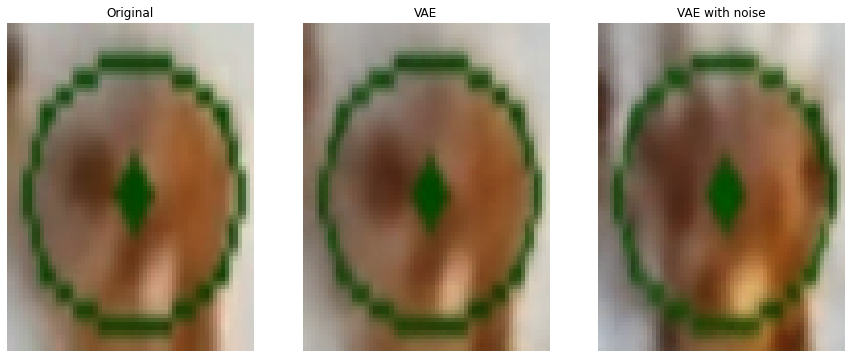

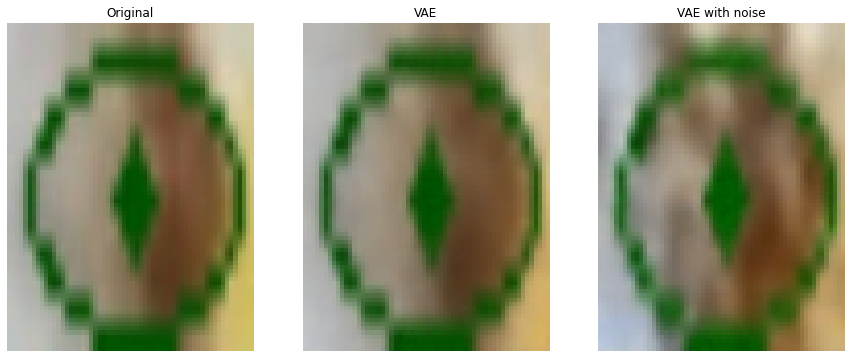

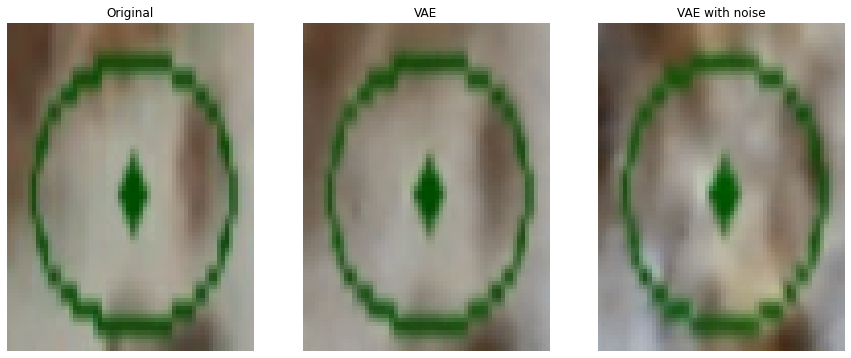

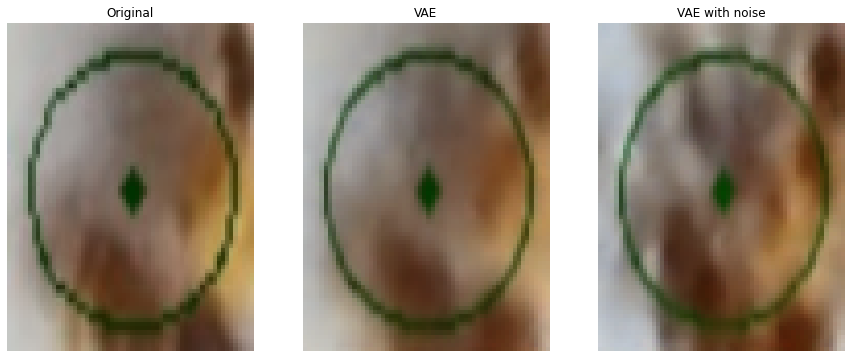

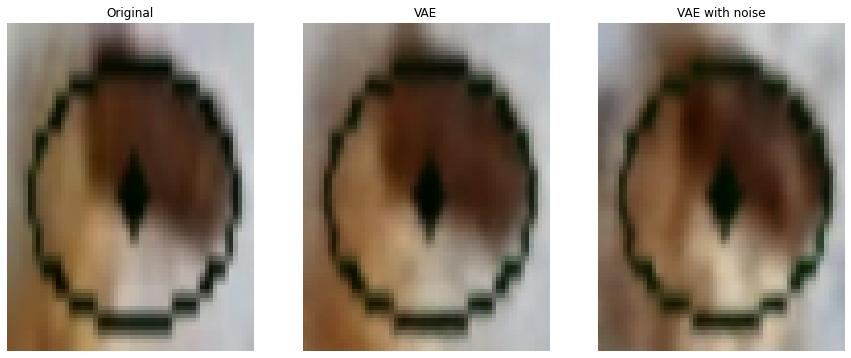

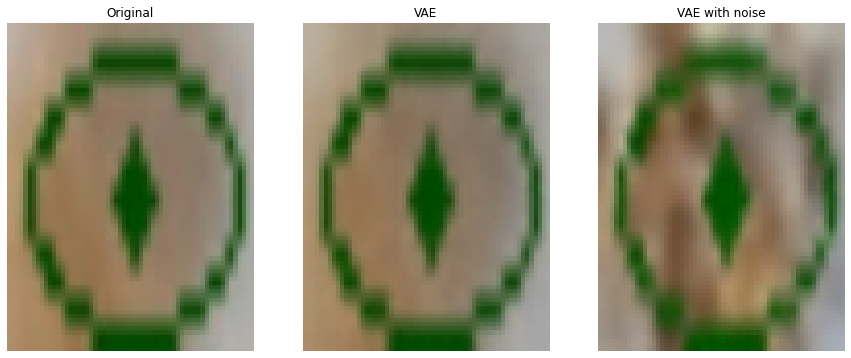

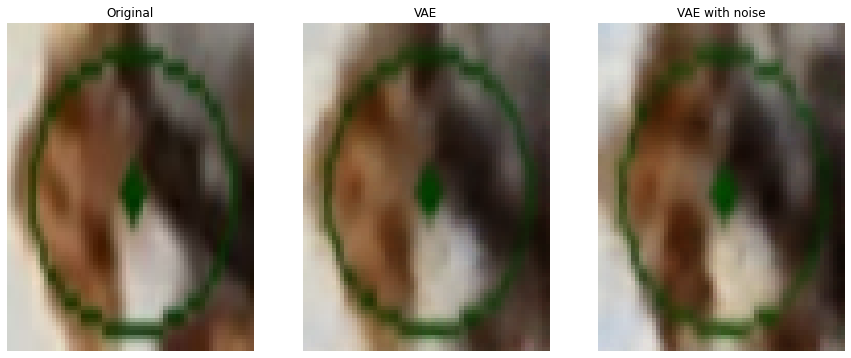

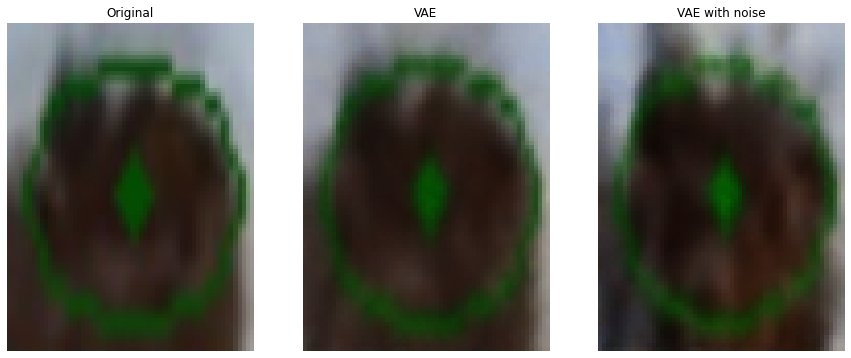

In [19]:
# Test data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

Here we get quite good results on the train and test data set. Adding noise to the encoded vector also doesn't seem to change the output drastically which means that encoded vectors close to each other also produce similar outputs.

### Training/Test, $\lambda$ = 1

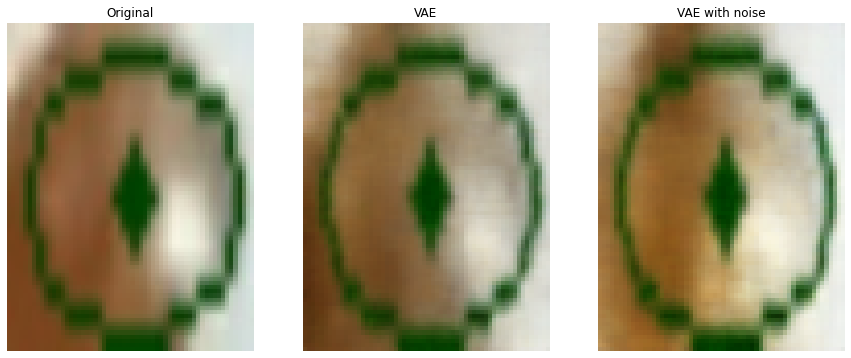

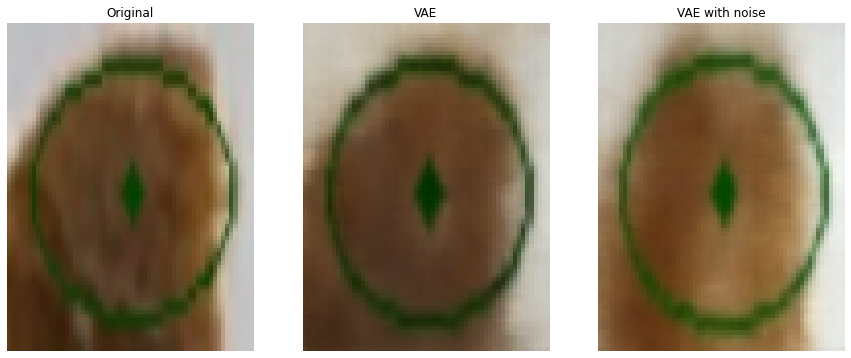

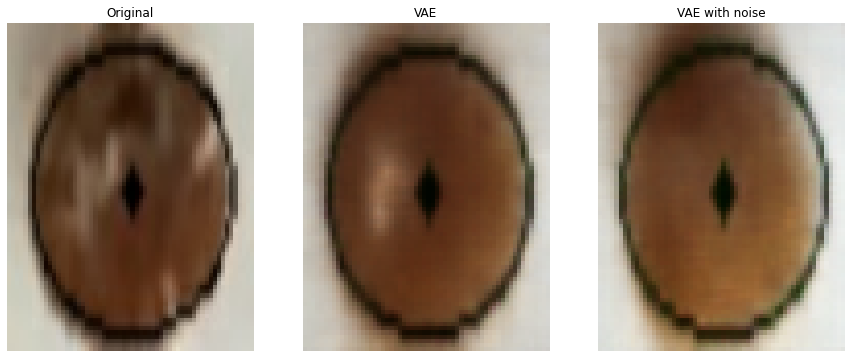

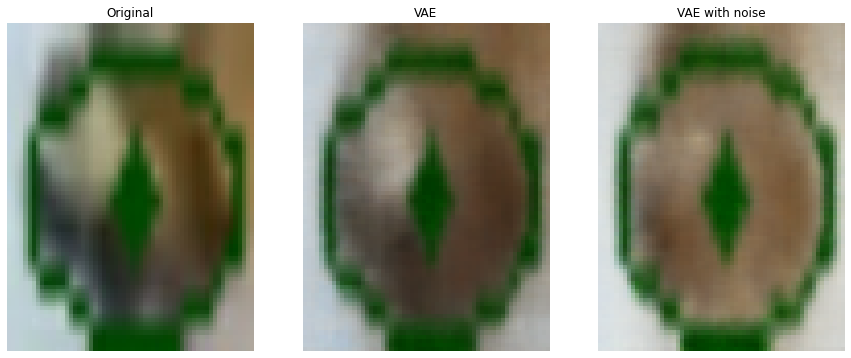

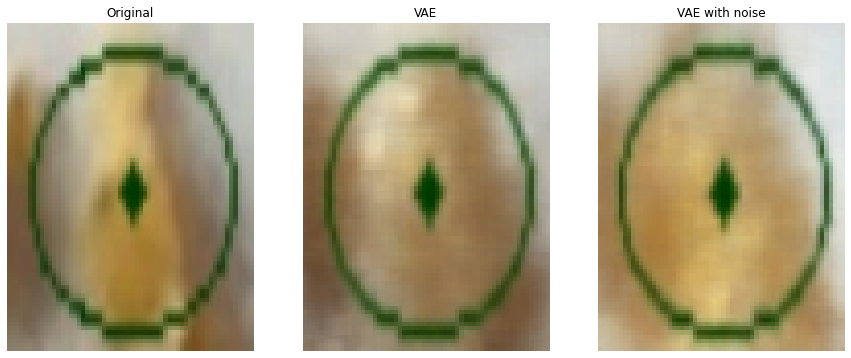

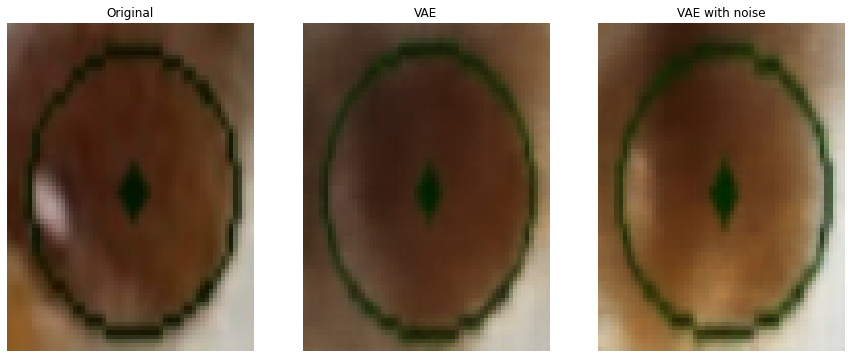

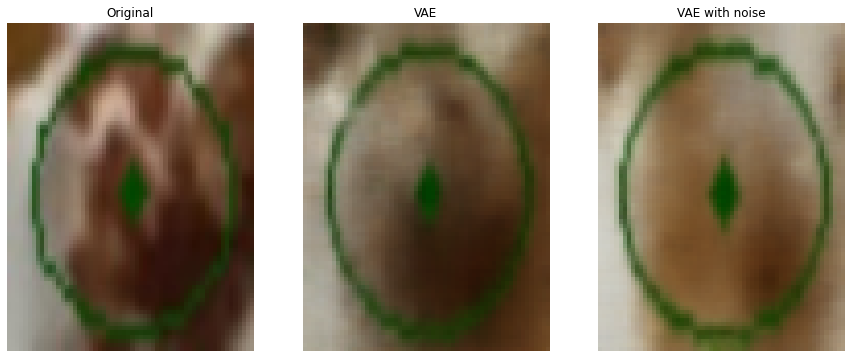

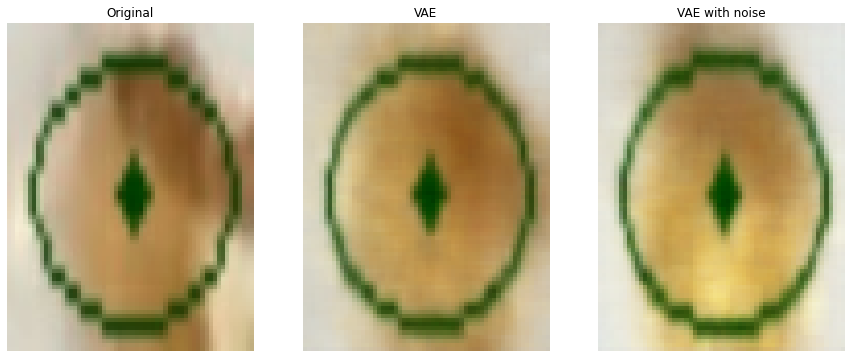

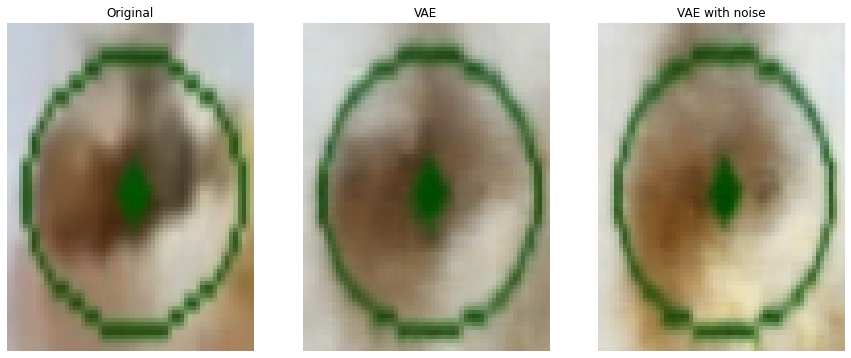

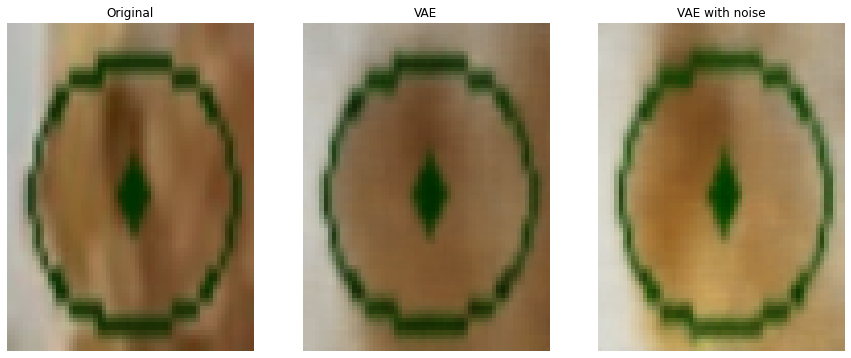

In [27]:
# Train data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

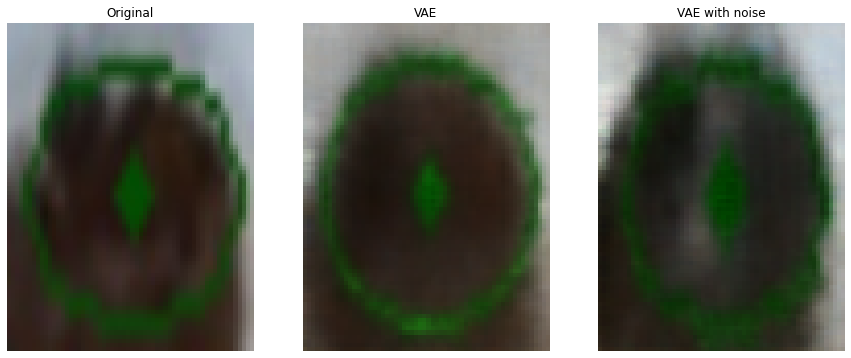

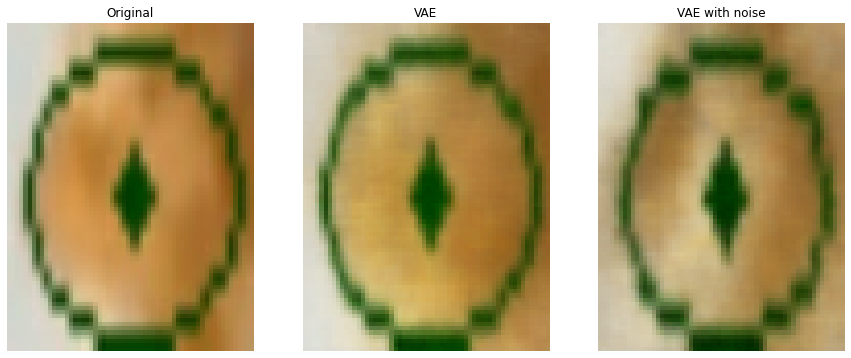

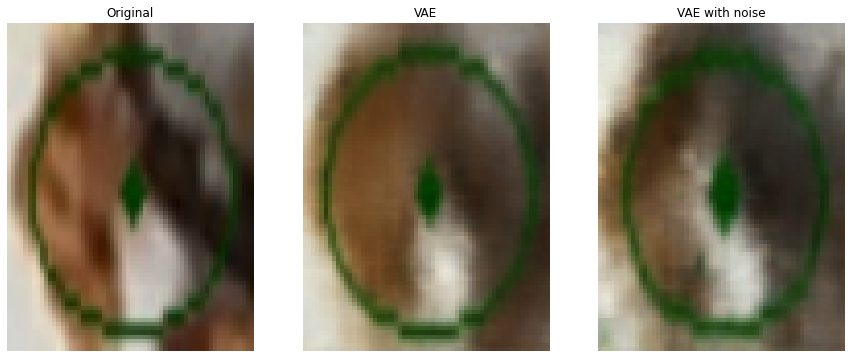

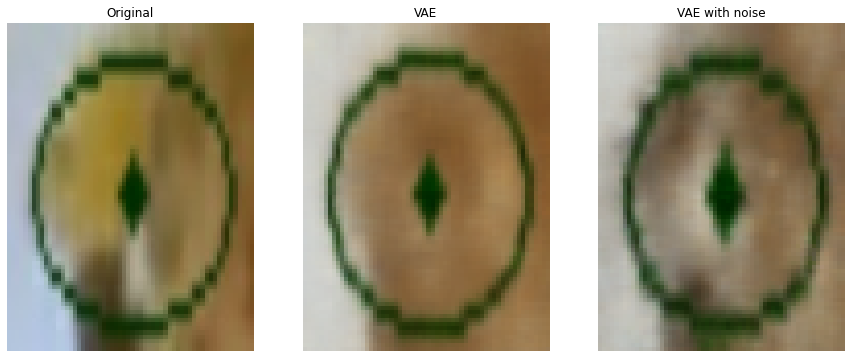

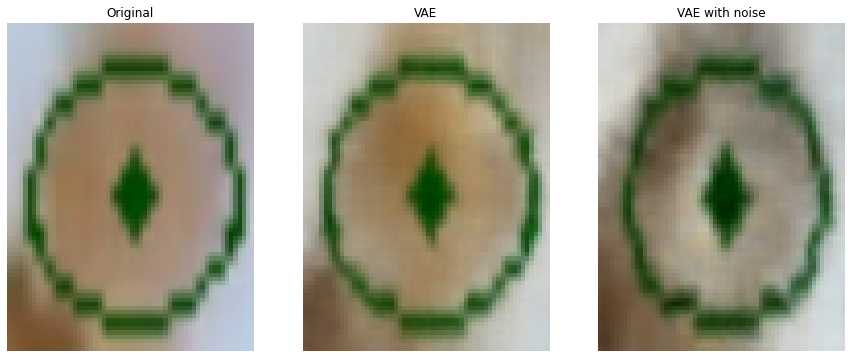

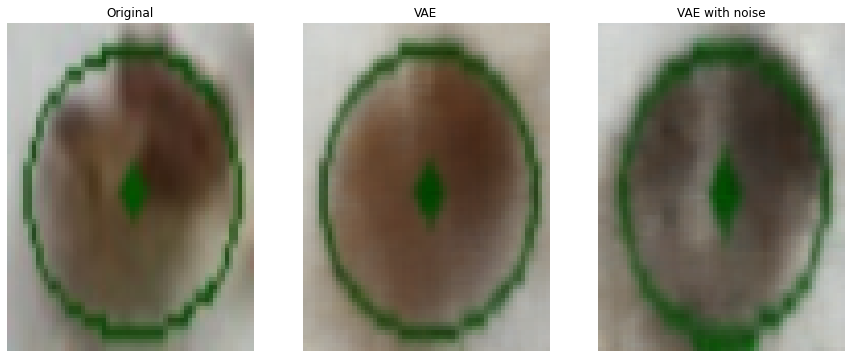

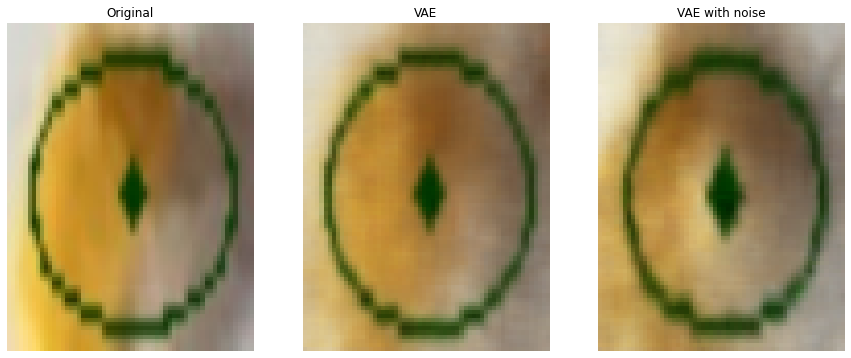

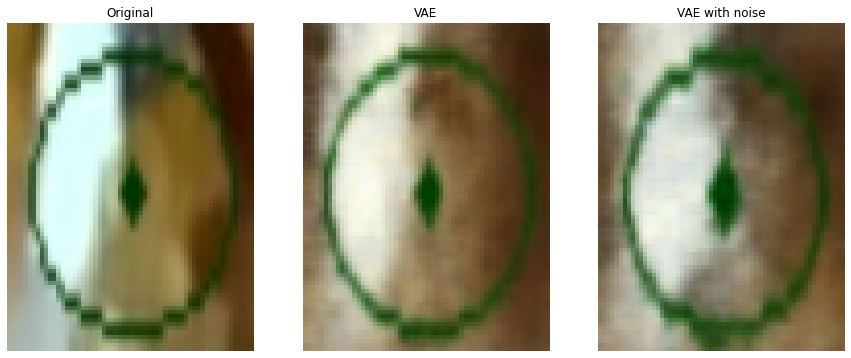

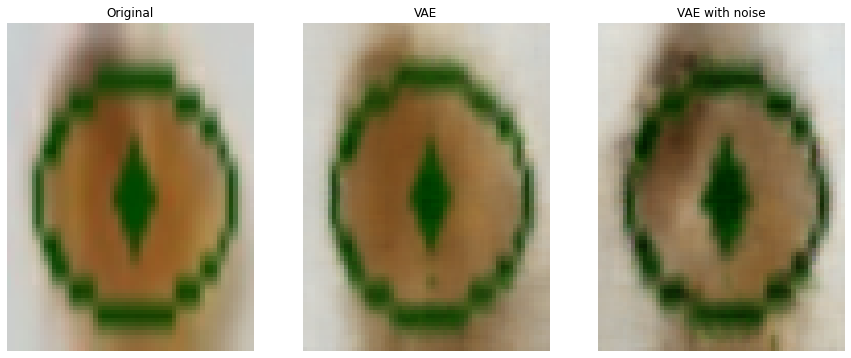

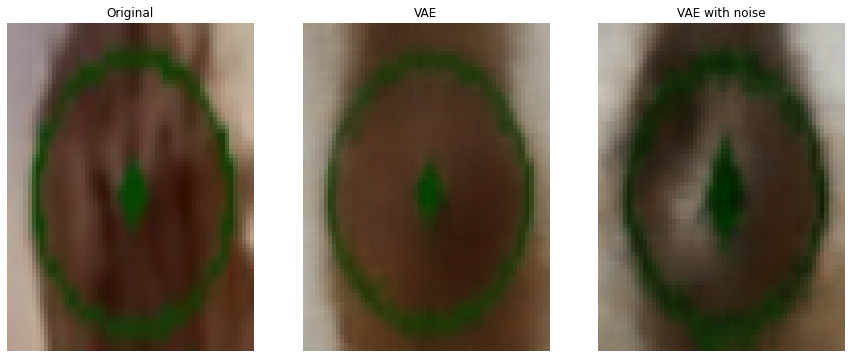

In [29]:
# Test data set
for original, reconstruction, noisy in zip(original, vae_data, noise_data):
    show_subplot(original, reconstruction, noisy)

Here the results are a little bit worse. Some fine-grained features are not reconstructed properly and we don't have a huge discrepance between train and test data set

### Conclusion
We have seen that setting a $\lambda$ to 0 close to 0 yield much better results. When adding a KL-term we expect (or want) the latent space to take the form of a distorted sphere. In the case of Coins the latent space seems to be more complex than that since adding noise to the encoded vector seems to change the reconstruction much more than in the case of setting $\lambda$ to 0. Also vectors close to each other doesn't seem to yield similar outputs (compared to the $\lambda$ =0 case).
So the latent space seems to be far off from a 128-dimensional sphere. One reason could be the small amount of training data used since an exponential amount of data is needed for each additional dimension of the latent space. Also the data used for training may lack diversity and colors making it even harder.